# OCR em vídeos - com Tesseract e EAST

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/fabiobento/sis-emb-2025-2/blob/main/aulas/sbc-rpi/rpi_ocr/docs/7-OCR_em_V%C3%ADdeos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/fabiobento/sis-emb-2025-2/blob/main/aulas/sbc-rpi/rpi_ocr/docs/7-OCR_em_V%C3%ADdeos.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

In [1]:
try:
    import google.colab
    IN_COLAB = True
    print("Executando no Google Colab")
except ImportError:
    IN_COLAB = False
    print("Não executando no Google Colab")

Não executando no Google Colab


In [2]:
if IN_COLAB:
    # Baixar imagens para o laboratório.
    !wget https://github.com/fabiobento/ocr-sis-emb-2024-2/raw/refs/heads/main/imagens.zip
    !unzip -n -q imagens.zip

    # Baixar fontes para o laboratório
    !wget https://github.com/fabiobento/ocr-sis-emb-2024-2/raw/refs/heads/main/fontes.zip
    !unzip -n -q fontes.zip
    
    # Baixar arquivo do modelo: `frozen_east_text_detection.pb` 
    %pip install gdown
    !mkdir -p ./Modelos
    !gdown --id 1-RbGz-8K7kC_Fve6J0eLtcRZQhmKS3UQ -O ./Modelos/frozen_east_text_detection.pb        
    
    # Baixar os videos
    # Baixar fontes para o laboratório
    !wget https://github.com/fabiobento/ocr-sis-emb-2024-2/raw/refs/heads/main/videos.zip
    !unzip -n -q videos.zip


# Importando as bibliotecas

In [3]:
import cv2
import imutils
import numpy as np
from matplotlib import pyplot as plt
if IN_COLAB:
    from google.colab.patches import cv2_imshow
else:
    %pip install imutils==0.5.4
import imutils    
from imutils.object_detection import non_max_suppression
from PIL import Image
from PIL import ImageFont, ImageDraw, Image

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [4]:
# Definir função para exibição de imagens
def imshow(imagem):
    if IN_COLAB:
        cv2_imshow(imagem)
    else:
        # Exibir a imagem com matplotlib
        if len(imagem.shape) == 2:  # Se a imagem tiver apenas 2 dimensões (níveis de cinza)
            plt.imshow(imagem, cmap='gray')
            plt.axis('off')  # Oculta os eixos
            plt.show()               
        else:
            plt.imshow(cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB))        
            plt.axis('off')  # Oculta os eixos
            plt.show()   

# Configuração do Tesseract

In [5]:
!sudo apt install tesseract-ocr
%pip install pytesseract
!mkdir tessdata
!wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

import pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 60 not upgraded.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
mkdir: cannot create directory ‘tessdata’: File exists
--2024-10-01 11:49:20--  https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/tesseract-ocr/tessdata/raw/refs/heads/main/por.traineddata [following]
--2024-10-01 11:49:20--  https://github.com/tesseract-ocr/tessdata/raw/refs/heads/main/por.traineddata
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Locat

In [6]:
config_tesseract = "--tessdata-dir tessdata --psm 7"

In [7]:
def tesseract_OCR(img, config_tesseract):
  texto = pytesseract.image_to_string(img, lang='por', config=config_tesseract)
  return texto

# Pré-processamento

Funções para pre-processar as imagens (ROI) extraídas do EAST, desse modo fica mais adequado antes de passar para o Tesseract

In [8]:
def pre_processamento(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  maior = cv2.resize(gray, None, fx=2.0, fy=2.0, interpolation=cv2.INTER_CUBIC)
  valor, otsu = cv2.threshold(maior, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
  return otsu

# Configuração do EAST

In [9]:
detector = './Modelos/frozen_east_text_detection.pb'
largura_EAST, altura_EAST = 640, 640 # 320x320

In [10]:
min_conf_EAST = 0.9 #@param {type:"number", min:0.0, max:1.0}

In [11]:
camadas_EAST = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

# Funções EAST

In [12]:
def dados_geometricos(geometry, y):
  x0_data = geometry[0, 0, y]
  x1_data = geometry[0, 1, y]
  x2_data = geometry[0, 2, y]
  x3_data = geometry[0, 3, y]
  data_angulos = geometry[0, 4, y]

  return data_angulos, x0_data, x1_data, x2_data, x3_data

In [13]:
def calculos_geometria(data_angulos, x0_data, x1_data, x2_data, x3_data, x, y):
  (offsetX, offsetY) = (x * 4.0, y * 4.0)

  angulo = data_angulos[x]
  cos = np.cos(angulo)
  sin = np.sin(angulo)

  h = x0_data[x] + x2_data[x]
  w = x1_data[x] + x3_data[x]

  fimX = int(offsetX + (cos * x1_data[x]) + (sin * x2_data[x]))
  fimY = int(offsetY - (sin * x1_data[x]) + (cos * x2_data[x]))
  inicioX = int(fimX - w)
  inicioY = int(fimY - h)

  return inicioX, inicioY, fimX, fimY

# Função para processamento da imagem

In [14]:
def EAST_processamento(img, largura, altura, net, nomes_camadas, min_confianca):
  original = img.copy()
  (H, W) = img.shape[:2]

  proporcao_W = W / float(largura)
  proporcao_H = H / float(altura)

  img = cv2.resize(img, (largura, altura))
  (H, W) = img.shape[:2]

  blob = cv2.dnn.blobFromImage(img, 1.0, (W, H), swapRB=True, crop=False)

  net.setInput(blob)
  (scores, geometry) = net.forward(nomes_camadas)

  (linhas, colunas) = scores.shape[2:4]

  caixas = []
  confiancas = []

  for y in range(0, linhas):
    data_scores = scores[0, 0, y]

    data_angulos, x0_data, x1_data, x2_data, x3_data = dados_geometricos(geometry, y)

    for x in range(0, colunas):
      if data_scores[x] < min_confianca:
        continue

      inicioX, inicioY, fimX, fimY = calculos_geometria(data_angulos, x0_data, x1_data, x2_data, x3_data, x, y)
      confiancas.append(data_scores[x])
      caixas.append((inicioX, inicioY, fimX, fimY))

  return proporcao_W, proporcao_H, confiancas, caixas

# Função para escrita no video

In [15]:
fonte = './Fontes/calibri.ttf'

In [16]:
def escreve_texto(texto, x, y, img, fonte, cor=(50, 50, 255), tamanho=22):
  fonte = ImageFont.truetype(fonte, tamanho)
  img_pil = Image.fromarray(img)
  draw = ImageDraw.Draw(img_pil)
  draw.text((x, y-tamanho), texto, font = fonte, fill = cor)
  img = np.array(img_pil)

  return img

In [17]:
def fundo_texto(texto, x, y, img, fonte, tamanho=32, cor_fundo=(200, 255, 0)):
  fundo = np.full((img.shape), (0,0,0), dtype=np.uint8)
  texto_fundo = escreve_texto(texto, x, y, fundo, fonte, (255,255,255), tamanho=tamanho)
  texto_fundo = cv2.dilate(texto_fundo,(np.ones((3,5),np.uint8)))
  fx,fy,fw,fh = cv2.boundingRect(texto_fundo[:,:,2])
  cv2.rectangle(img, (fx, fy), (fx + fw, fy + fh), cor_fundo, -1)

  return img

# Carrega modelo EAST

In [18]:
EASTnet = cv2.dnn.readNet(detector)

# Carrega o arquivo de vídeo

In [19]:
arquivo_video = './Videos/videoteste02.mp4'
cap = cv2.VideoCapture(arquivo_video)
conectado, video = cap.read()
print(conectado, video)

True [[[172 109  79]
  [172 109  79]
  [172 109  79]
  ...
  [201 209 208]
  [199 209 208]
  [199 209 208]]

 [[172 109  79]
  [172 109  79]
  [172 109  79]
  ...
  [201 209 208]
  [199 209 208]
  [199 209 208]]

 [[173 110  80]
  [173 110  80]
  [173 110  80]
  ...
  [201 209 208]
  [199 209 208]
  [199 209 208]]

 ...

 [[101 101  99]
  [101 101  99]
  [101 101  99]
  ...
  [ 94  99 105]
  [ 94  99 105]
  [ 94  99 105]]

 [[101 101  99]
  [101 101  99]
  [101 101  99]
  ...
  [ 34  39  45]
  [ 34  39  45]
  [ 36  41  47]]

 [[101 101  99]
  [101 101  99]
  [101 101  99]
  ...
  [ 22  27  33]
  [ 22  27  33]
  [ 22  27  33]]]


In [20]:
video.shape

(720, 1284, 3)

In [21]:
video_largura = video.shape[1]
video_altura = video.shape[0]

# Redimensionamento do tamanho do video (opcional)

In [22]:
def redimensionar(largura, altura, largura_maxima = 600):
  if largura > largura_maxima:
    proporcao = largura / altura
    video_largura = largura_maxima
    video_altura = int(video_largura / proporcao)
  else:
    video_largura = largura
    video_altura = altura
  return video_largura, video_altura

In [23]:
video_largura, video_altura = redimensionar(video.shape[1], video.shape[0], 800)
print(video_largura, video_altura)

800 448


# Definindo as configurações do vídeo

In [24]:
nome_arquivo = 'resultado_east_tesseract.avi'

In [25]:
fourcc = cv2.VideoWriter_fourcc(*'XVID')

FourCC é um código de 4 bytes usado para especificar o codec de vídeo. A lista de códigos disponíveis pode ser encontrada no site fourcc.org
* Codecs mais usados: XVID, MP4V, MJPG, DIVX, X264...
* Por exemplo, para salvar em formato mp4 utiliza-se o codec mp4v (o nome do arquivo também precisa possuir a extensão .mp4)

 fourcc = cv2.VideoWriter_fourcc(*'mp4v')

Mais exemplos de outras configurações com o fourcc que é possível usar: https://www.programcreek.com/python/example/89348/cv2.VideoWriter_fourcc

In [26]:
fps = 24

In [27]:
saida_video = cv2.VideoWriter(nome_arquivo, fourcc, fps, (video_largura, video_altura))

# Definindo as variáveis

In [28]:
amostras_exibir = 20
amostra_atual = 0

In [29]:
margem = 4

# Processamento do vídeo e exibição do resultado

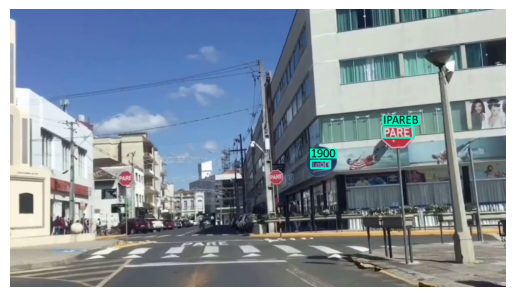

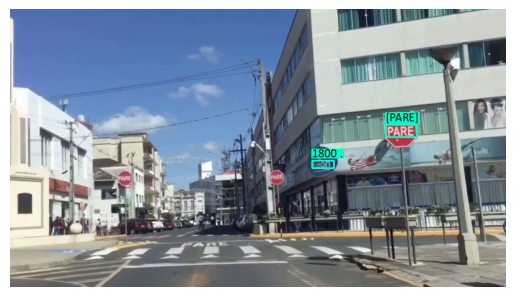

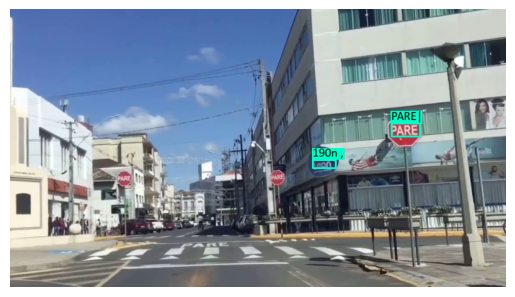

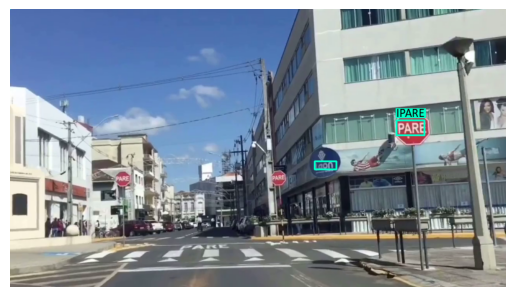

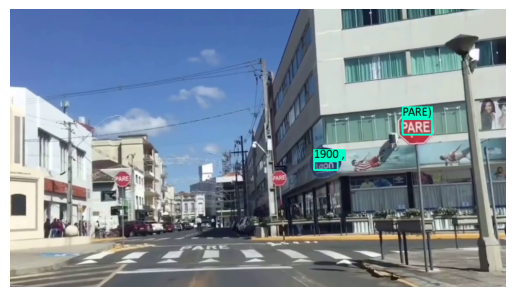

...

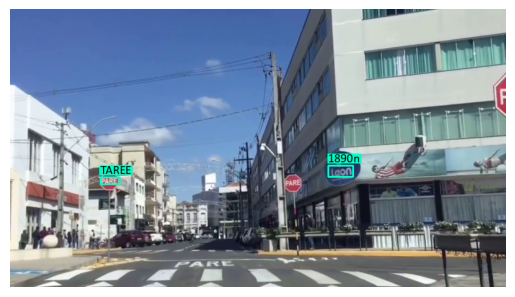

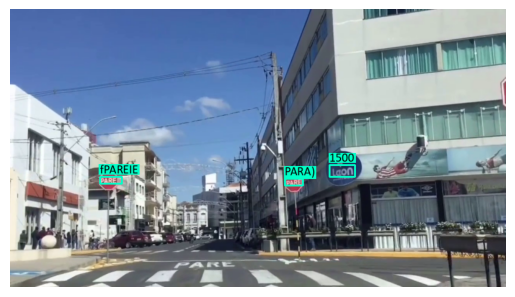

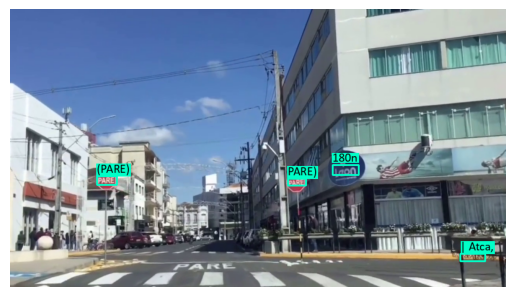

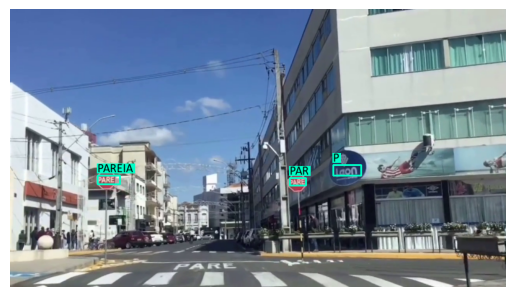

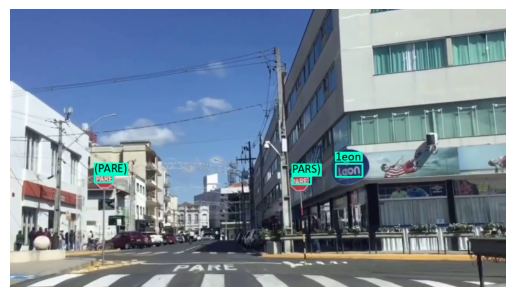

Terminou!


In [30]:
while (cv2.waitKey(1) < 0):
    conectado, frame = cap.read()

    if not conectado:
        break

    # Redimensiona o quadro para o tamanho desejado
    frame = cv2.resize(frame, (video_largura, video_altura))

    # Faz uma cópia do frame para processamento
    imagem_cp = frame.copy()

    # Processamento EAST para detecção de caixas e proporções
    proporcao_W, proporcao_H, confiancas, caixas = EAST_processamento(
        frame, largura_EAST, altura_EAST, EASTnet, camadas_EAST, min_conf_EAST)
    deteccoes = non_max_suppression(np.array(caixas), probs=confiancas)

    # Loop sobre as detecções para desenhar retângulos e processar as imagens
    for (inicioX, inicioY, fimX, fimY) in deteccoes:
        # Ajustar as coordenadas com base na proporção
        inicioX = int(inicioX * proporcao_W)
        inicioY = int(inicioY * proporcao_H)
        fimX = int(fimX * proporcao_W)
        fimY = int(fimY * proporcao_H)

        # Verificar e ajustar as coordenadas para que estejam dentro da imagem
        inicioX = max(0, min(inicioX, video_largura - 1))
        inicioY = max(0, min(inicioY, video_altura - 1))
        fimX = max(0, min(fimX, video_largura - 1))
        fimY = max(0, min(fimY, video_altura - 1))

        # Desenhar o retângulo na imagem
        cv2.rectangle(frame, (inicioX, inicioY), (fimX, fimY), (200, 255, 0), 2)

        # Definir a ROI (Região de Interesse) com verificação de limites
        y1 = max(inicioY - margem, 0)
        y2 = min(fimY + margem, video_altura)
        x1 = max(inicioX - margem, 0)
        x2 = min(fimX + margem, video_largura)
        
        roi = imagem_cp[y1:y2, x1:x2]

        # Verificar se a ROI não está vazia
        if roi is None or roi.size == 0:
            continue  # Pula essa iteração se a ROI estiver vazia

        # Processar a ROI com a função pre_processamento
        img_process = pre_processamento(roi)

        # Realizar OCR na ROI processada
        texto = tesseract_OCR(img_process, config_tesseract)

        # Limpar o texto de caracteres não-ASCII
        texto = ''.join([c if ord(c) < 128 else '' for c in texto]).strip()

        # Adicionar fundo ao texto na imagem
        frame = fundo_texto(texto, inicioX, inicioY, frame, fonte, 20, (200, 255, 0))

        # Escrever o texto na imagem
        frame = escreve_texto(texto, inicioX, inicioY, frame, fonte, (0, 0, 0), 20)

    # Exibir as imagens processadas enquanto o contador de amostras for válido
    if amostra_atual <= amostras_exibir:
        imshow(frame)
        amostra_atual += 1

    # Salvar o frame processado no arquivo de vídeo
    saida_video.write(frame)

# Encerrar a gravação do vídeo e fechar as janelas
print('Terminou!')
saida_video.release()
cv2.destroyAllWindows()

# OCR em vídeos com EasyOCR

In [31]:
%pip install easyocr

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [32]:
from easyocr import Reader

In [33]:
lista_idiomas = "en,pt"
idiomas = lista_idiomas.split(",")
print(idiomas)

gpu = True #@param {type:"boolean"}
fonte = './Fontes/calibri.ttf' #@param {type:"string"}

['en', 'pt']


In [34]:
arquivo_video = "./Videos/videoteste02.mp4"
cap = cv2.VideoCapture(arquivo_video)

conectado, video = cap.read()
video_largura = video.shape[1]
video_altura = video.shape[0]

In [35]:
video_largura, video_altura = redimensionar(video.shape[1], video.shape[0], 800)
print(video_largura,video_altura)

800 448


In [36]:
def coord_caixa(caixa):
  (te, td, bd, be) = caixa
  te = (int(te[0]), int(te[1]))
  td = (int(td[0]), int(td[1]))
  bd = (int(bd[0]), int(bd[1]))
  be = (int(be[0]), int(be[1]))
  return te, td, bd, be

def desenha_caixa(img, te, bd, cor_caixa=(200, 255, 0), espessura=2):
  cv2.rectangle(img, te, bd, cor_caixa, espessura)
  return img

In [37]:
nome_arquivo = 'resultado_easy.avi'
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24
saida_video = cv2.VideoWriter(nome_arquivo, fourcc, fps, (video_largura, video_altura))

In [38]:
amostras_exibir = 20
amostra_atual = 0

In [39]:
cor_fonte = (0,0,0)
cor_fundo = (200,255,0)
cor_caixa = (200,255,0)
tam_fonte = 20

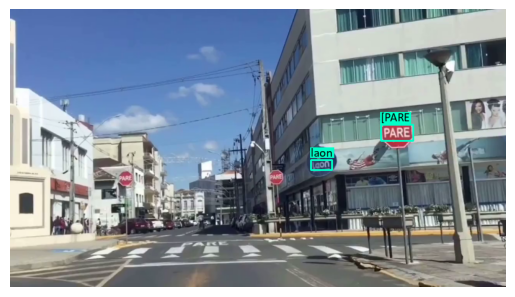

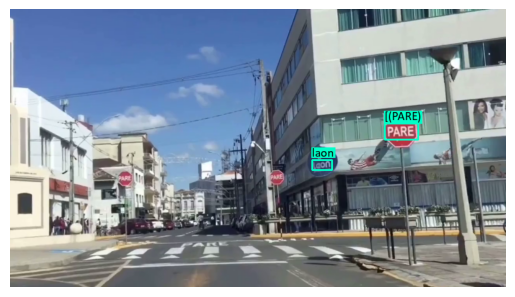

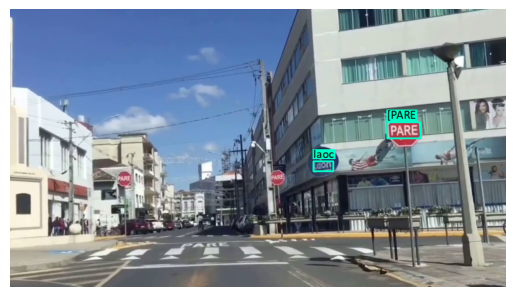

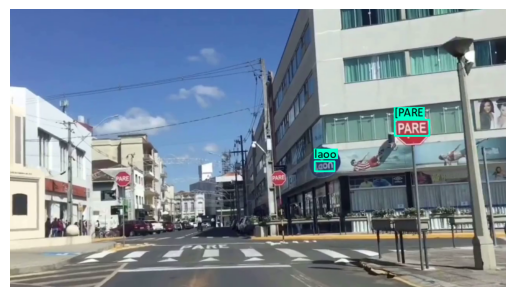

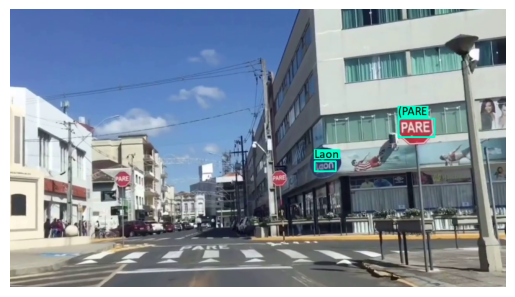

...

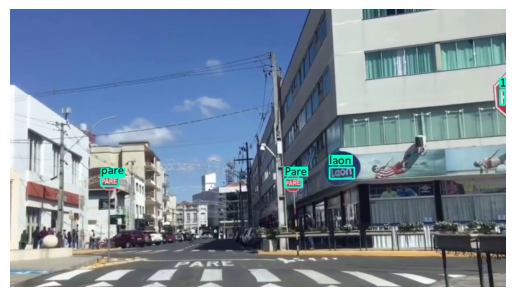

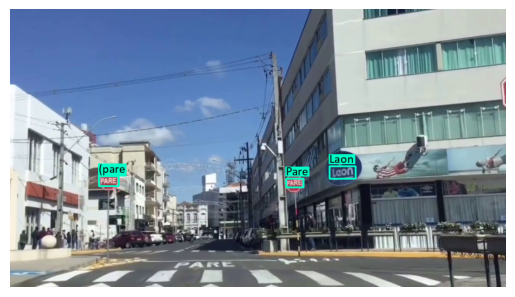

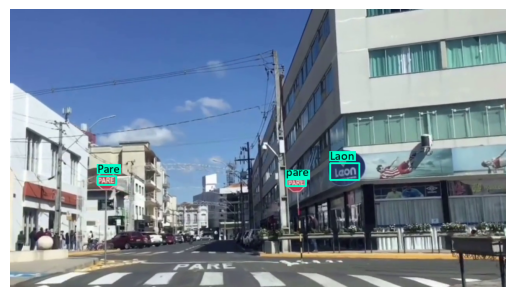

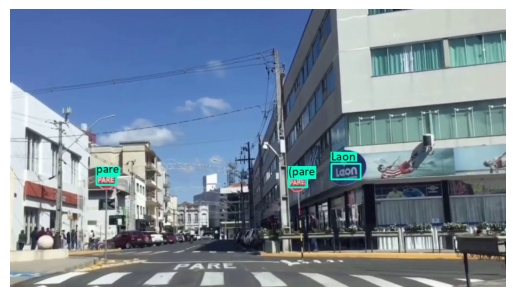

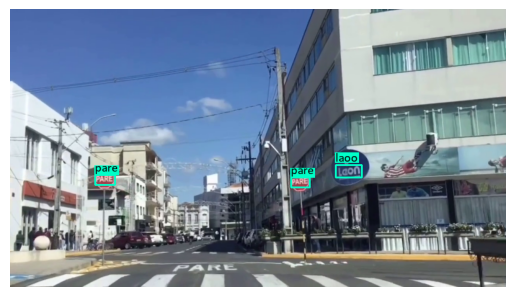

Terminou


In [40]:
while (cv2.waitKey(1) < 0):
    conectado, frame = cap.read()

    if not conectado:
        break

    frame = cv2.resize(frame, (video_largura, video_altura))

    imagem_cp = frame.copy()

    reader = Reader(idiomas, gpu=gpu)
    resultados = reader.readtext(frame)

    for (caixa, texto, prob) in resultados:
      te, td, bd, be = coord_caixa(caixa)

      frame = desenha_caixa(frame, te, bd)
      frame = fundo_texto(texto, te[0], te[1], frame, fonte, tam_fonte, cor_fundo)
      frame = escreve_texto(texto, te[0], te[1], frame, fonte, cor_fonte, tam_fonte)

    if amostra_atual <= amostras_exibir:
      imshow(frame)
      amostra_atual = amostra_atual + 1

    saida_video.write(frame)

print("Terminou")
saida_video.release()
cv2.destroyAllWindows()